In [17]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [18]:
# --- CONFIGURE THIS ---
input_csv_folder = r"C:\Users\chris\Desktop\University\Thesis\PipelineResults\10_patients_GM_tiles"
# ----------------------

csv_files = glob.glob(os.path.join(input_csv_folder, "pipeline_run_*.csv"))

dfs = []
for path in csv_files:
    temp_df = pd.read_csv(path)
    temp_df = temp_df.rename(columns={"scan_folder": "scan_name"})
    dfs.append(temp_df)

df = pd.concat(dfs, ignore_index=True)

features = [
    "skeleton_length",
    "num_junctions",
    "num_components",
    "num_end_nodes",
    "num_start_nodes",
    "total_nodes",
    "end_to_start_ratio",
    "soma_area",
    "soma_perimeter",
    "soma_circularity",
    "cell_area",
    "cell_perimeter",
    "cell_convex_hull_area",
    "cell_convex_hull_perimeter",
    "cell_solidity",
    "cell_convexity",
    "cell_circularity",
    "cell_convex_circularity",
    "branch_area",
    "branch_perimeter",
    "sholl_min_radius",
    "sholl_peak_radius",
    "sholl_max_radius",
    "sholl_peak",
    "sholl_sum",
]

print(f"Number of cells in analysis {len(df)}")

Number of cells in analysis 156589


Remove Outliers based on cell_area

In [19]:
lower = df["cell_area"].quantile(0.002)
upper = df["cell_area"].quantile(0.998)

df = df[
    (df["cell_area"] >= lower) &
    (df["cell_area"] <= upper)
].copy()

print(f"Removed very small or very large cells")

print(f"Number of cells in analysis {len(df)}")

Removed very small or very large cells
Number of cells in analysis 155963


Remove cells that touch the image border (not fully contained in the tile)

In [20]:
# Tiles are 512x512 pixels.
# A cell whose bounding box touches any edge of the tile was clipped and
# therefore not fully visible. We remove any cell where:
#   xmin == 0  (touches left edge)
#   ymin == 0  (touches top edge)
#   xmax >= TILE_SIZE - 1  (touches right edge)
#   ymax >= TILE_SIZE - 1  (touches bottom edge)

TILE_SIZE = 512

before = len(df)

df = df[
    (df["xmin"] > 0 + 1) &
    (df["ymin"] > 0 + 1) &
    (df["xmax"] < TILE_SIZE - 1) &
    (df["ymax"] < TILE_SIZE - 1)
].copy()

print(f"Removed {before - len(df)} border-clipped cells ({before} -> {len(df)})")


# 117162

Removed 49226 border-clipped cells (155963 -> 106737)


Histogram of a selected feature

PCA Plot

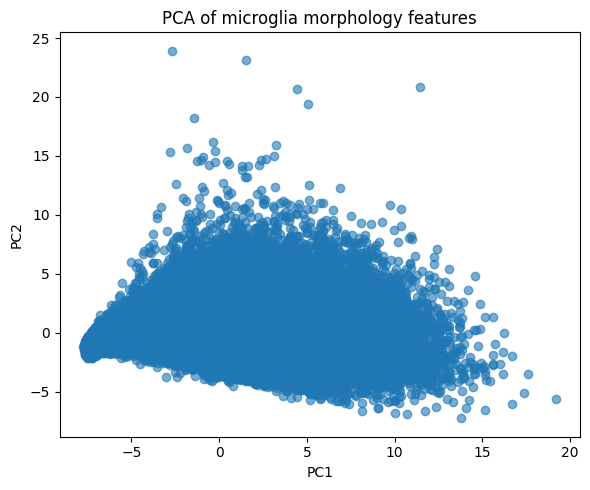

In [21]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

X = df[features].dropna()
X_scaled = StandardScaler().fit_transform(X)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(6, 5))
plt.scatter(X_pca[:, 0], X_pca[:, 1], alpha=0.6)
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("PCA of microglia morphology features")
plt.tight_layout()
plt.show()


PCA Elbow Plot – cumulative explained variance

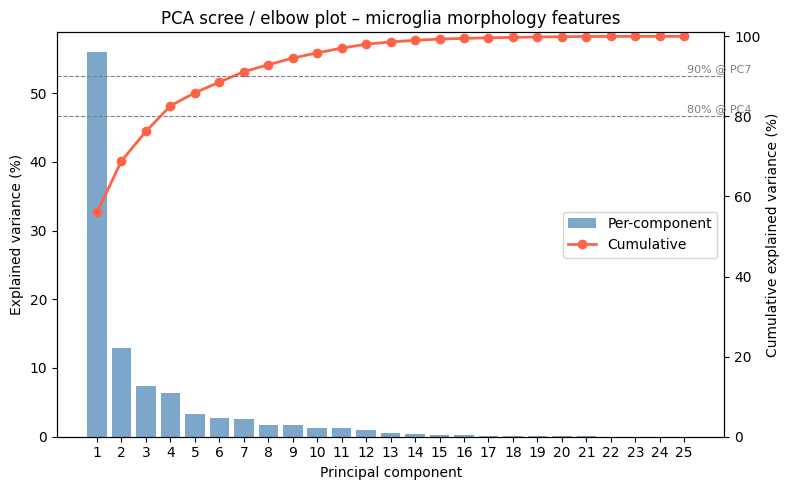

Variance explained by 2 PCs : 68.9%
Dims needed for 80% variance: 4
Dims needed for 90% variance: 7


In [22]:
from sklearn.decomposition import PCA as _PCA

pca_full = _PCA().fit(X_scaled)
ev = pca_full.explained_variance_ratio_
cumev = ev.cumsum()
n_components = range(1, len(ev) + 1)

fig, ax1 = plt.subplots(figsize=(8, 5))

# Bar chart – per-component variance
ax1.bar(n_components, ev * 100, color="steelblue", alpha=0.7, label="Per-component")
ax1.set_xlabel("Principal component")
ax1.set_ylabel("Explained variance (%)")
ax1.set_xticks(list(n_components))

# Line – cumulative variance
ax2 = ax1.twinx()
ax2.plot(n_components, cumev * 100, color="tomato", marker="o", linewidth=2, label="Cumulative")
ax2.set_ylabel("Cumulative explained variance (%)")
ax2.set_ylim(0, 101)

# Reference lines at 80 % and 90 %
for thresh in (80, 90):
    ax2.axhline(thresh, linestyle="--", color="grey", linewidth=0.8)
    n_thresh = int((cumev * 100 >= thresh).argmax()) + 1
    ax2.text(len(ev) + 0.1, thresh + 0.5, f"{thresh}% @ PC{n_thresh}", fontsize=8, color="grey", va="bottom")

# Combine legends
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc="center right")

plt.title("PCA scree / elbow plot – microglia morphology features")
plt.tight_layout()
plt.show()

print(f"Variance explained by 2 PCs : {cumev[1]*100:.1f}%")
print(f"Dims needed for 80% variance: {int((cumev >= 0.80).argmax()) + 1}")
print(f"Dims needed for 90% variance: {int((cumev >= 0.90).argmax()) + 1}")


## PCA – Trustworthiness & Continuity

In [ ]:
from sklearn.manifold import trustworthiness
from sklearn.neighbors import NearestNeighbors
import numpy as np

def continuity(X_high, X_low, n_neighbors=10):
    """
    Continuity score: measures how well true high-dim neighbours are
    preserved in the low-dim embedding. Penalises missing neighbours
    (points close in original space that are far apart in the embedding).
    Range: 0 (worst) to 1 (perfect). Higher is better.
    """
    n = X_high.shape[0]
    # k nearest neighbours in high-dim space (excluding self)
    nbrs_high = NearestNeighbors(n_neighbors=n_neighbors + 1).fit(X_high)
    _, ind_high = nbrs_high.kneighbors(X_high)
    ind_high = ind_high[:, 1:]  # drop self

    # rank of every point in low-dim space from each point's perspective
    nbrs_low = NearestNeighbors(n_neighbors=n).fit(X_low)
    _, ind_low_full = nbrs_low.kneighbors(X_low)
    rank_low = np.empty((n, n), dtype=int)
    for i in range(n):
        rank_low[i, ind_low_full[i]] = np.arange(n)

    # sum penalty for true high-dim neighbours that are distant in low-dim
    penalty = 0
    for i in range(n):
        for j in ind_high[i]:
            r = rank_low[i, j]  # 0-indexed rank in low-dim (0 = closest)
            if r > n_neighbors:
                penalty += r - n_neighbors

    normaliser = n_neighbors * n * (2 * n - 3 * n_neighbors - 1) / 2
    return 1 - penalty / normaliser


# --- CONFIGURE THIS ---
TC_SUBSAMPLE = 10000   # number of points to use (full dataset is too slow)
TC_N_NEIGHBORS = 10  # neighbourhood size k
# ----------------------

rng_tc = np.random.default_rng(42)
tc_idx = rng_tc.choice(len(X_scaled), size=min(TC_SUBSAMPLE, len(X_scaled)), replace=False)

X_high_sample = X_scaled[tc_idx]
X_pca_sample  = X_pca[tc_idx]

tw_pca = trustworthiness(X_high_sample, X_pca_sample, n_neighbors=TC_N_NEIGHBORS)
ct_pca = continuity(X_high_sample, X_pca_sample, n_neighbors=TC_N_NEIGHBORS)
f1_pca = 2 * tw_pca * ct_pca / (tw_pca + ct_pca)

print(f"PCA  |  Trustworthiness: {tw_pca:.4f}  |  Continuity: {ct_pca:.4f}  |  F1_TC: {f1_pca:.4f}  (k={TC_N_NEIGHBORS}, n={len(tc_idx)})")


PCA  |  Trustworthiness: 0.9035  |  Continuity: 0.9757  (k=10, n=5000)


Basic Clustering

In [24]:
import numpy as np
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans

# Hierarchical clustering into 4 clusters
# clusterer = AgglomerativeClustering(
#     n_clusters=5,
#     linkage="ward"
# )

clusterer = KMeans(
    n_clusters=4,
    n_init=50,
    random_state=42
)


cluster_labels = clusterer.fit_predict(X_scaled)
df_clustered = df.loc[X.index].copy()
df_clustered["cluster"] = cluster_labels



In [25]:
import cv2
import matplotlib.pyplot as plt

def show_yolo_box(image_path, box, color=(0, 0, 255), linewidth=2):
    """
    Display an image with a YOLO bounding box overlaid.

    Parameters
    ----------
    image_path : str
        Path to the image file.
    box : tuple
        (x_min, y_min, x_max, y_max) in pixel coordinates.
    color : tuple
        RGB color for the box.
    linewidth : int
        Line thickness.
    """
    # Read image (BGR)
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError(f"Could not read image: {image_path}")

    # Convert to RGB for matplotlib
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    x_min, y_min, x_max, y_max = map(int, box)

    # Draw rectangle
    cv2.rectangle(
        image_rgb,
        (x_min, y_min),
        (x_max, y_max),
        color,
        linewidth
    )

    # Show image
    plt.figure(figsize=(6, 6))
    plt.imshow(image_rgb)
    plt.axis("off")
    plt.title("YOLO bounding box")
    plt.show()

In [26]:
from scipy.spatial.distance import cdist

def show_cluster_representatives(
    df_source,
    cluster_col,
    X_feature,
    title_prefix,
    idx_array=None,
    cluster_labels_array=None,
):
    """
    Display the N most-central representative cells for each cluster.

    Parameters
    ----------
    df_source : pd.DataFrame
        DataFrame whose index aligns with X_scaled (or a subsampled slice of it).
        Must have been filtered/cleaned the same way as X_scaled.
    cluster_col : str
        Name of the column in df_source that holds cluster labels.
        Pass None when cluster_labels_array is provided instead.
    X_feature : np.ndarray, shape (n_samples, n_dims)
        The coordinate space used to compute distances to the centroid
        (e.g. X_scaled for KMeans, X_tsne_fast for t-SNE, X_phate for PHATE).
    title_prefix : str
        Prefix used in the figure suptitle, e.g. 'Cluster', 't-SNE Cluster'.
    idx_array : array-like or None
        When the method used a subsample, pass the index array (e.g. tsne_idx,
        phate_idx) so we can build the correct sub-dataframe from df_clustered.
        Pass None if df_source already covers the full dataset (KMeans case).
    cluster_labels_array : array-like or None
        When cluster labels are not yet a column in df_source, pass the label
        array here and it will be added as cluster_col.
    """
    # If a subsample index is given, build the aligned sub-dataframe
    if idx_array is not None:
        df_index_array = df_clustered.index.to_numpy()
        sampled_df_index = df_index_array[idx_array]
        working_df = df_clustered.loc[sampled_df_index].copy()
    else:
        working_df = df_source.copy()

    # Attach cluster labels if not already present
    if cluster_labels_array is not None:
        working_df[cluster_col] = cluster_labels_array

    for cluster_id in sorted(working_df[cluster_col].unique()):
        cluster_mask = working_df[cluster_col] == cluster_id
        cluster_df = working_df[cluster_mask]

        # Feature vectors for this cluster (in the chosen coordinate space)
        X_cluster = X_feature[cluster_mask.values]

        # Centroid and distances
        centroid = X_cluster.mean(axis=0, keepdims=True)
        distances = cdist(X_cluster, centroid, metric='euclidean').flatten()

        # N closest cells
        closest_idxs = np.argsort(distances)[:N_REPRESENTATIVES]

        # Build representative metadata
        reps = []
        for idx in closest_idxs:
            global_index = cluster_df.iloc[idx].name
            reps.append({
                'global_cell_id': df.loc[global_index, 'global_cell_id'],
                'distance_to_centroid': distances[idx],
                'scan_name': df.loc[global_index, 'scan_name'],
                'image_name': df.loc[global_index, 'image_name'],
                'xmin': df.loc[global_index, 'xmin'],
                'ymin': df.loc[global_index, 'ymin'],
                'xmax': df.loc[global_index, 'xmax'],
                'ymax': df.loc[global_index, 'ymax'],
            })

        # Plot all N representatives side-by-side
        n = len(reps)
        fig, axes = plt.subplots(1, n, figsize=(6 * n, 6))
        if n == 1:
            axes = [axes]
        fig.suptitle(f"{title_prefix} {cluster_id} \u2013 {n} most central cells", fontsize=14)

        for ax, r in zip(axes, reps):
            image_path = os.path.join(scan_data_root, r['scan_name'], r['image_name'] + '.jpg')
            image = cv2.imread(image_path)
            if image is None:
                ax.set_title(f"NOT FOUND\n{r['image_name']}")
                ax.axis('off')
                continue
            image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            x_min, y_min, x_max, y_max = int(r['xmin']), int(r['ymin']), int(r['xmax']), int(r['ymax'])
            cv2.rectangle(image_rgb, (x_min, y_min), (x_max, y_max), (0, 0, 255), 2)
            ax.imshow(image_rgb)
            ax.axis('off')
            ax.set_title(
                f"{r['global_cell_id']}\nd={r['distance_to_centroid']:.3f}",
                fontsize=7
            )

        plt.tight_layout()
        plt.show()


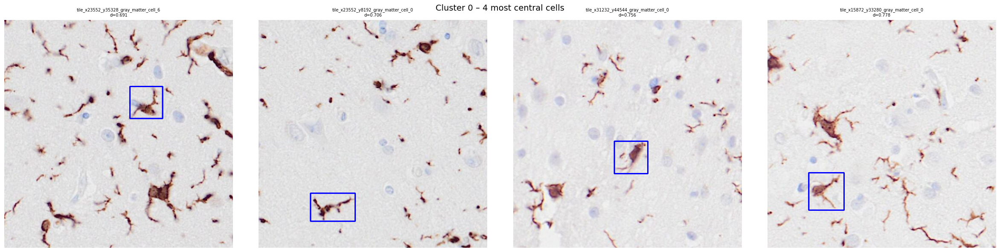

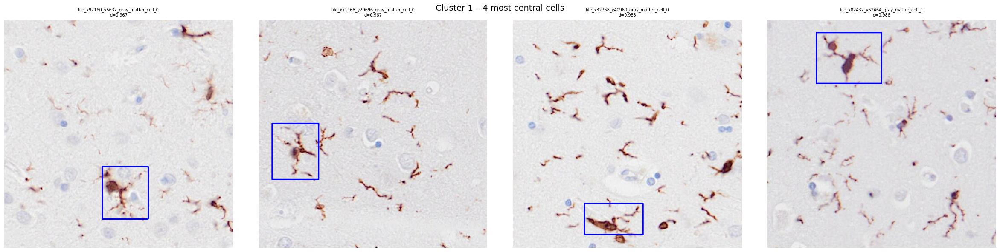

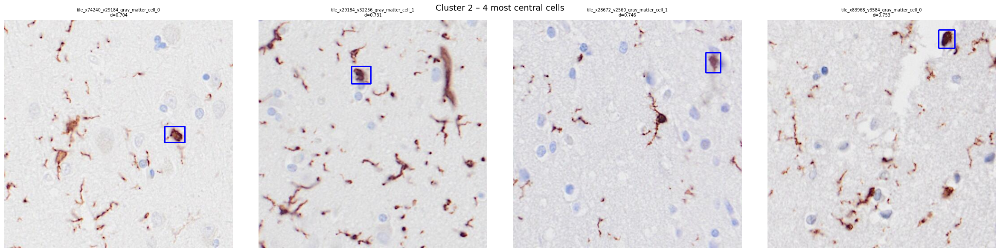

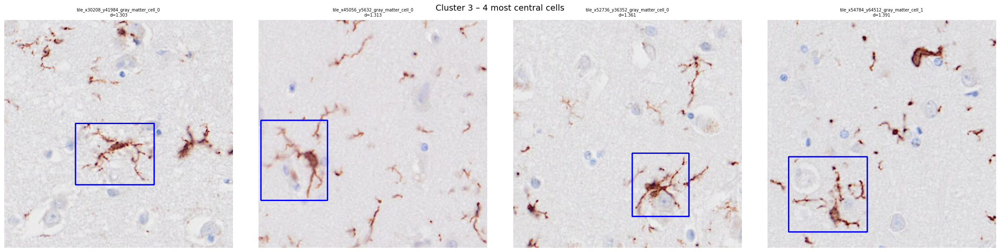

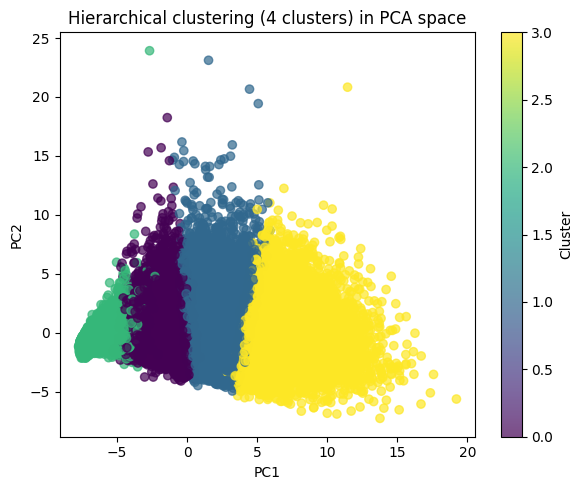

In [27]:
# --- CONFIGURE THIS ---
scan_data_root = r"C:\Users\chris\Desktop\University\Thesis\ScanData\10_patients_GM_tiles"
N_REPRESENTATIVES = 4  # number of most-central cells to show per cluster
# ----------------------

# KMeans clustering: distances computed in the original high-dimensional scaled space
show_cluster_representatives(
    df_source=df_clustered,
    cluster_col="cluster",
    X_feature=X_scaled,
    title_prefix="Cluster",
)

plt.figure(figsize=(6, 5))
scatter = plt.scatter(
    X_pca[:, 0],
    X_pca[:, 1],
    c=cluster_labels,
    alpha=0.7
)
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("Hierarchical clustering (4 clusters) in PCA space")
plt.colorbar(scatter, label="Cluster")
plt.tight_layout()
plt.show()

## t-SNE Embedding

openTSNE runtime: 202.60s
t-SNE  |  Trustworthiness: 0.9805  |  Continuity: 0.9628  (k=10, n=5000)
  k=2  silhouette=0.4057
  k=3  silhouette=0.3674
  k=4  silhouette=0.3889

Best k for openTSNE: 2 (silhouette=0.4057)


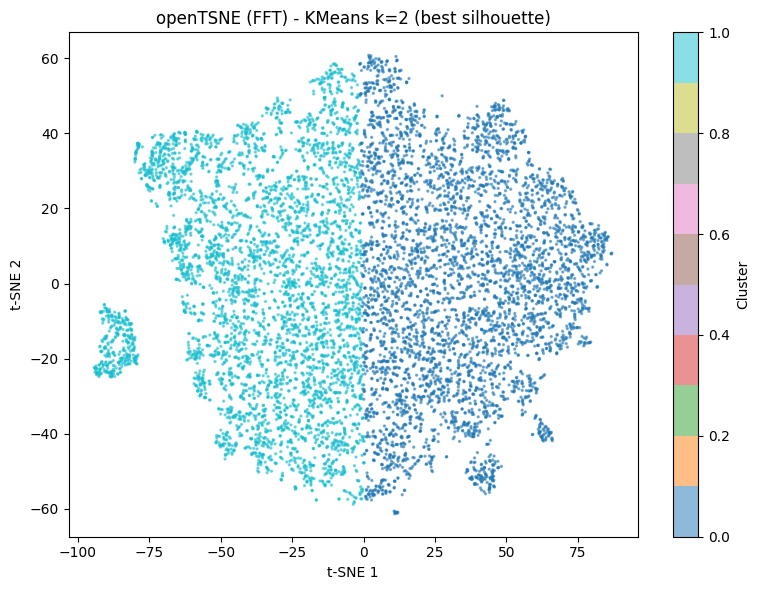

In [28]:
import time
from openTSNE import TSNE as openTSNE
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# openTSNE -- much faster than sklearn on large data (FFT-accelerated Barnes-Hut)
# pip install openTSNE

# --- CONFIGURE THIS ---
TSNE_SUBSAMPLE = 10000  # keep the same as the sklearn cell for a fair comparison
TSNE_K_RANGE = range(2, 5)
# ----------------------

if TSNE_SUBSAMPLE is not None and TSNE_SUBSAMPLE < len(X_scaled):
    rng = np.random.default_rng(42)
    tsne_fast_idx = rng.choice(len(X_scaled), size=TSNE_SUBSAMPLE, replace=False)
    X_tsne_fast_input = X_scaled[tsne_fast_idx]
else:
    tsne_fast_idx = np.arange(len(X_scaled))
    X_tsne_fast_input = X_scaled

t0 = time.perf_counter()
tsne_fast = openTSNE(
    n_components=2,
    perplexity=30,
    negative_gradient_method='fft',  # FFT-accelerated, much faster than exact/bh
    n_jobs=6,                        # use all CPU cores
    random_state=42,
)
X_tsne_fast = np.array(tsne_fast.fit(X_tsne_fast_input))
fast_time = time.perf_counter() - t0
print(f'openTSNE runtime: {fast_time:.2f}s')

# --- Trustworthiness & Continuity (uses the same TC_SUBSAMPLE / TC_N_NEIGHBORS
#     defined in the PCA T&C cell; re-index into the tsne subsample) ---
tsne_tc_size = min(TC_SUBSAMPLE, len(X_tsne_fast_input))
rng_tsne_tc = np.random.default_rng(0)
tsne_tc_local_idx = rng_tsne_tc.choice(len(X_tsne_fast_input), size=tsne_tc_size, replace=False)
tw_tsne = trustworthiness(X_tsne_fast_input[tsne_tc_local_idx], X_tsne_fast[tsne_tc_local_idx], n_neighbors=TC_N_NEIGHBORS)
ct_tsne = continuity(X_tsne_fast_input[tsne_tc_local_idx], X_tsne_fast[tsne_tc_local_idx], n_neighbors=TC_N_NEIGHBORS)
f1_tsne = 2 * tw_tsne * ct_tsne / (tw_tsne + ct_tsne)
print(f't-SNE  |  Trustworthiness: {tw_tsne:.4f}  |  Continuity: {ct_tsne:.4f}  |  F1_TC: {f1_tsne:.4f}  (k={TC_N_NEIGHBORS}, n={tsne_tc_size})')

# Pick k with the highest silhouette score
tsne_fast_sil_scores = {}
for k in TSNE_K_RANGE:
    labels = KMeans(n_clusters=k, n_init=50, random_state=42).fit_predict(X_tsne_fast)
    tsne_fast_sil_scores[k] = silhouette_score(X_tsne_fast, labels)
    print(f'  k={k}  silhouette={tsne_fast_sil_scores[k]:.4f}')

tsne_fast_best_k = max(tsne_fast_sil_scores, key=tsne_fast_sil_scores.get)
print(f'\nBest k for openTSNE: {tsne_fast_best_k} (silhouette={tsne_fast_sil_scores[tsne_fast_best_k]:.4f})')

tsne_fast_kmeans = KMeans(n_clusters=tsne_fast_best_k, n_init=50, random_state=42)
tsne_fast_cluster_labels = tsne_fast_kmeans.fit_predict(X_tsne_fast)

plt.figure(figsize=(8, 6))
scatter = plt.scatter(X_tsne_fast[:, 0], X_tsne_fast[:, 1], c=tsne_fast_cluster_labels, cmap='tab10', s=2, alpha=0.5)
plt.colorbar(scatter, label='Cluster')
plt.title(f'openTSNE (FFT) - KMeans k={tsne_fast_best_k} (best silhouette)')
plt.xlabel('t-SNE 1')
plt.ylabel('t-SNE 2')
plt.tight_layout()
plt.show()


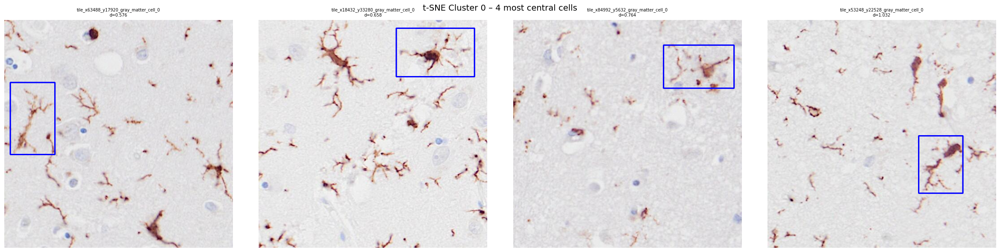

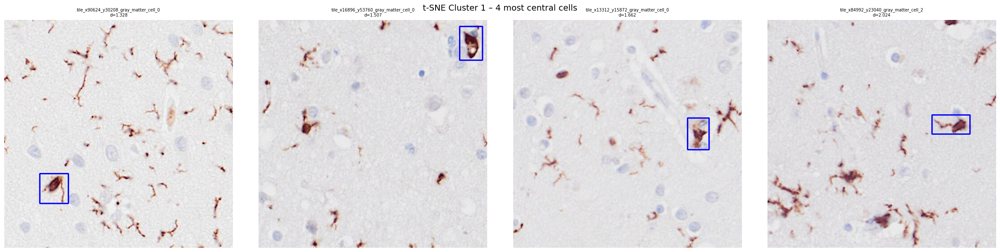

In [30]:
# t-SNE clustering: distances computed in 2D t-SNE embedding space
# (tsne_fast_idx, X_tsne_fast, and tsne_fast_cluster_labels are defined by the t-SNE cell above)
show_cluster_representatives(
    df_source=df_clustered,
    cluster_col="tsne_fast_cluster",
    X_feature=X_tsne_fast,
    title_prefix="t-SNE Cluster",
    idx_array=tsne_fast_idx,
    cluster_labels_array=tsne_fast_cluster_labels,
)


## PHATE Embedding

Calculating PHATE...
  Running PHATE on 40000 observations and 25 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 3.80 seconds.
    Calculating affinities...
    Calculated affinities in 1.27 seconds.
  Calculated graph and diffusion operator in 5.17 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 7.88 seconds.
    Calculating KMeans...
    Calculated KMeans in 9.85 seconds.
  Calculated landmark operator in 17.74 seconds.
  Calculating optimal t...
    Automatically selected t = 23
  Calculated optimal t in 8.57 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 2.78 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 7.02 seconds.
Calculated PHATE in 44.79 seconds.
PHATE  |  Trustworthiness: 0.8813  |  Continuity: 0.9506  (k=10, n=5000)
  k=2  silhouette=0.7497
  k=3  silhouette=0.4785
  k=4  silhouette=0.4927

Best k for PHATE: 2 (si

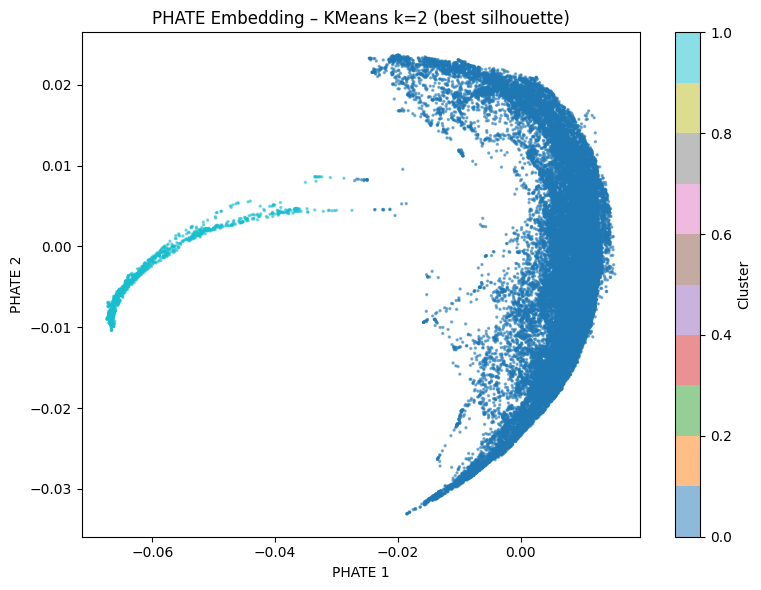

In [31]:
import subprocess, sys
# subprocess.check_call([sys.executable, "-m", "pip", "install", "phate", "-q"])
import phate
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# --- CONFIGURE THIS ---
PHATE_SUBSAMPLE = 40000  # set to None to use all data
PHATE_K_RANGE = range(2, 5)  # candidate values of k to evaluate
# ----------------------

if PHATE_SUBSAMPLE is not None and PHATE_SUBSAMPLE < len(X_scaled):
    rng = np.random.default_rng(42)
    phate_idx = rng.choice(len(X_scaled), size=PHATE_SUBSAMPLE, replace=False)
    X_phate_input = X_scaled[phate_idx]
else:
    phate_idx = np.arange(len(X_scaled))
    X_phate_input = X_scaled

phate_op = phate.PHATE(n_components=2, random_state=42)
X_phate = phate_op.fit_transform(X_phate_input)

# --- Trustworthiness & Continuity ---
phate_tc_size = min(TC_SUBSAMPLE, len(X_phate_input))
rng_phate_tc = np.random.default_rng(0)
phate_tc_local_idx = rng_phate_tc.choice(len(X_phate_input), size=phate_tc_size, replace=False)
tw_phate = trustworthiness(X_phate_input[phate_tc_local_idx], X_phate[phate_tc_local_idx], n_neighbors=TC_N_NEIGHBORS)
ct_phate = continuity(X_phate_input[phate_tc_local_idx], X_phate[phate_tc_local_idx], n_neighbors=TC_N_NEIGHBORS)
f1_phate = 2 * tw_phate * ct_phate / (tw_phate + ct_phate)
print(f'PHATE  |  Trustworthiness: {tw_phate:.4f}  |  Continuity: {ct_phate:.4f}  |  F1_TC: {f1_phate:.4f}  (k={TC_N_NEIGHBORS}, n={phate_tc_size})')

# Pick k with the highest silhouette score
phate_sil_scores = {}
for k in PHATE_K_RANGE:
    labels = KMeans(n_clusters=k, n_init=50, random_state=42).fit_predict(X_phate)
    phate_sil_scores[k] = silhouette_score(X_phate, labels)
    print(f"  k={k}  silhouette={phate_sil_scores[k]:.4f}")

phate_best_k = max(phate_sil_scores, key=phate_sil_scores.get)
print(f"\nBest k for PHATE: {phate_best_k} (silhouette={phate_sil_scores[phate_best_k]:.4f})")

phate_kmeans = KMeans(n_clusters=phate_best_k, n_init=50, random_state=42)
phate_cluster_labels = phate_kmeans.fit_predict(X_phate)

plt.figure(figsize=(8, 6))
scatter = plt.scatter(X_phate[:, 0], X_phate[:, 1], c=phate_cluster_labels, cmap="tab10", s=2, alpha=0.5)
plt.colorbar(scatter, label="Cluster")
plt.title(f"PHATE Embedding – KMeans k={phate_best_k} (best silhouette)")
plt.xlabel("PHATE 1")
plt.ylabel("PHATE 2")
plt.tight_layout()
plt.show()

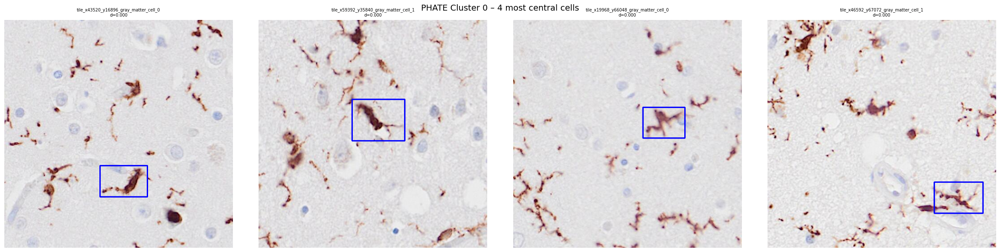

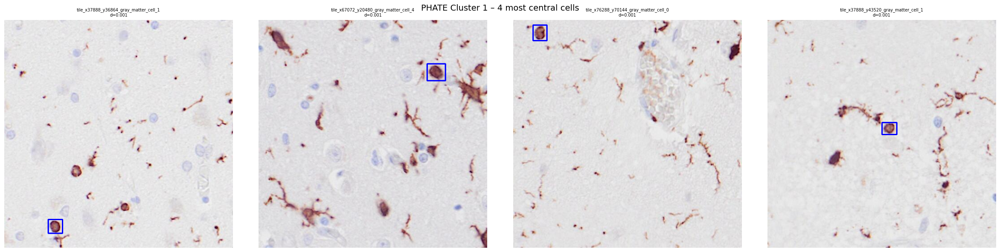

In [32]:
# PHATE clustering: distances computed in 2D PHATE embedding space
show_cluster_representatives(
    df_source=df_clustered,
    cluster_col="phate_cluster",
    X_feature=X_phate,
    title_prefix="PHATE Cluster",
    idx_array=phate_idx,
    cluster_labels_array=phate_cluster_labels,
)
